In [1]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.metrics import accuracy_score,confusion_matrix,roc_auc_score,roc_curve
from pandas_profiling import ProfileReport

In [2]:
df = pd.read_csv('https://raw.githubusercontent.com/mlflow/mlflow-example/master/wine-quality.csv')

In [3]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [4]:
df.shape

(4898, 12)

In [5]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
df[df.duplicated()]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.900000,6
5,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.100000,6
7,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.800000,6
8,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.500000,6
20,6.2,0.66,0.48,1.2,0.029,29.0,75.0,0.98920,3.33,0.39,12.800000,8
...,...,...,...,...,...,...,...,...,...,...,...,...
4828,6.4,0.23,0.35,10.3,0.042,54.0,140.0,0.99670,3.23,0.47,9.200000,5
4850,7.0,0.36,0.35,2.5,0.048,67.0,161.0,0.99146,3.05,0.56,11.100000,6
4851,6.4,0.33,0.44,8.9,0.055,52.0,164.0,0.99488,3.10,0.48,9.600000,5
4856,7.1,0.23,0.39,13.7,0.058,26.0,172.0,0.99755,2.90,0.46,9.000000,6


In [7]:
df.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

In [8]:
X= df.drop('quality', axis=1)
y= df['quality']

In [9]:
y.head()

0    6
1    6
2    6
3    6
4    6
Name: quality, dtype: int64

In [10]:
X.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9


In [11]:
## Train test split

X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3,random_state=100)

In [12]:
dtc = DecisionTreeClassifier()

In [13]:
dtc.fit(X_train,y_train)

DecisionTreeClassifier()

In [14]:
y_pred = dtc.predict(X_test)

In [15]:
dtc.score(X_test,y_test)

0.6074829931972789

In [16]:
confusion_matrix(y_test,y_pred)

array([[  0,   0,   3,   2,   2,   0,   0],
       [  1,  16,  15,  10,   3,   0,   0],
       [  0,  13, 261, 112,  18,   4,   0],
       [  0,  17, 145, 442,  77,  14,   0],
       [  1,   2,  20,  73, 154,  15,   0],
       [  0,   0,   3,  15,  10,  20,   0],
       [  0,   1,   0,   0,   0,   1,   0]])

In [39]:
dtc1 = DecisionTreeClassifier(criterion='entropy')

In [40]:
dtc1.fit(X_train,y_train)

DecisionTreeClassifier(criterion='entropy')

In [41]:
dtc1.predict(X_test)

array([5, 5, 5, ..., 5, 6, 5])

In [42]:
dtc1.score(X_test,y_test)

0.6108843537414966

In [43]:
dotfile = open('modeldecisiontree.dot','w')

tree.export_graphviz(dtc1,dotfile,feature_names=X.columns)


In [44]:
dir()

['DecisionTreeClassifier',
 'GridSearchCV',
 'In',
 'Out',
 'ProfileReport',
 'X',
 'X_test',
 'X_train',
 '_',
 '_10',
 '_13',
 '_15',
 '_16',
 '_18',
 '_19',
 '_20',
 '_22',
 '_23',
 '_25',
 '_26',
 '_27',
 '_29',
 '_3',
 '_30',
 '_33',
 '_34',
 '_35',
 '_37',
 '_38',
 '_4',
 '_40',
 '_41',
 '_42',
 '_5',
 '_6',
 '_7',
 '_9',
 '__',
 '___',
 '__builtin__',
 '__builtins__',
 '__doc__',
 '__loader__',
 '__name__',
 '__package__',
 '__spec__',
 '__vsc_ipynb_file__',
 '_dh',
 '_i',
 '_i1',
 '_i10',
 '_i11',
 '_i12',
 '_i13',
 '_i14',
 '_i15',
 '_i16',
 '_i17',
 '_i18',
 '_i19',
 '_i2',
 '_i20',
 '_i21',
 '_i22',
 '_i23',
 '_i24',
 '_i25',
 '_i26',
 '_i27',
 '_i28',
 '_i29',
 '_i3',
 '_i30',
 '_i31',
 '_i32',
 '_i33',
 '_i34',
 '_i35',
 '_i36',
 '_i37',
 '_i38',
 '_i39',
 '_i4',
 '_i40',
 '_i41',
 '_i42',
 '_i43',
 '_i44',
 '_i5',
 '_i6',
 '_i7',
 '_i8',
 '_i9',
 '_ih',
 '_ii',
 '_iii',
 '_oh',
 'accuracy_score',
 'confusion_matrix',
 'df',
 'dotfile',
 'dtc',
 'dtc1',
 'exit',
 'get_ipyt

[Text(0.5536534364267857, 0.9791666666666666, 'X[10] <= 10.85\nentropy = 1.872\nsamples = 3428\nvalue = [13, 118, 1049, 1503, 615, 127, 3]'),
 Text(0.35149146210719245, 0.9375, 'X[1] <= 0.267\nentropy = 1.655\nsamples = 2161\nvalue = [8, 92, 921, 925, 190, 25, 0]'),
 Text(0.17446127976084558, 0.8958333333333334, 'X[1] <= 0.207\nentropy = 1.661\nsamples = 1156\nvalue = [5, 19, 363, 584, 163, 22, 0]'),
 Text(0.10310531513576995, 0.8541666666666666, 'X[3] <= 10.15\nentropy = 1.718\nsamples = 510\nvalue = [2, 8, 109, 270, 104, 17, 0]'),
 Text(0.06755800918182142, 0.8125, 'X[10] <= 10.117\nentropy = 1.618\nsamples = 368\nvalue = [2, 7, 95, 200, 61, 3, 0]'),
 Text(0.032554539307448664, 0.7708333333333334, 'X[0] <= 8.45\nentropy = 1.588\nsamples = 203\nvalue = [2, 6, 66, 106, 23, 0, 0]'),
 Text(0.015712302928929854, 0.7291666666666666, 'X[2] <= 0.245\nentropy = 1.503\nsamples = 190\nvalue = [1, 3, 59, 104, 23, 0, 0]'),
 Text(0.003416491690095733, 0.6875, 'X[3] <= 5.85\nentropy = 0.999\nsample

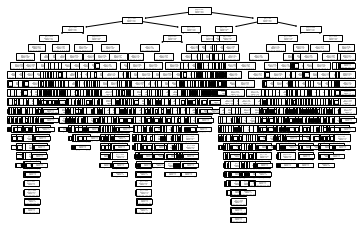

In [45]:
tree.plot_tree(dtc1.fit(X_train,y_train))